# Examples

## Simple example

First we generate a small dataset by adding uniform noise to ``f(x)=|x|``

In [1]:
using Random, Distributions

n = 50
x = range(-5, 5; length=n)
dx = x[2] - x[1]

f_noisy = abs.(x) + rand(Uniform(-0.05, 0.05), n);

┌ Info: Precompiling Distributions [31c24e10-a181-5473-b8eb-7969acd0382f]
└ @ Base loading.jl:1313


then we call `TVRegDiff` using a regularization parameter of `α=0.2` for 100 iterations.

In [2]:
using NoiseRobustDifferentiation
include("../literate/plot_examples.jl") # hide

û = TVRegDiff(f_noisy, 100, 0.2; dx=dx);

We compare the results to the true derivative ``u(x)=sign(x)`` and a naive implementation of finite differences.

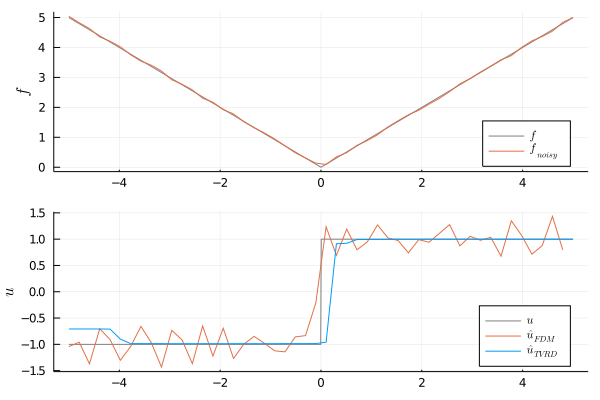

In [3]:
û_FDM = diff(f_noisy) / dx  # FDM
plot_example_abs(abs, sign, x, f_noisy, û_FDM, û) # hide

# Examples from paper
Let's reconstruct the figures from Rick Chartrand's paper *"Numerical differentiation of noisy, non-smooth data"*.
The corresponding datasets can be found under `/docs/data`.

## Small-scale example
The small-scale example in the paper is a more noisy variant of our first example. We start by loading the data.

In [4]:
using CSV, DataFrames

file = CSV.File("../data/demo_small.csv")
df = DataFrame(file)
data = df.noisyabsdata

100-element Vector{Float64}:
 0.4947568209484847
 0.4586436468008027
 0.495540390492081
 0.42718631878097685
 0.4437491612025675
 0.4134766649846369
 0.4352793199633473
 0.47641752033136997
 0.44712390205478175
 0.45718015772594506
 ⋮
 0.4882820479196238
 0.3481098141965433
 0.5411864432483494
 0.4888894642794186
 0.4325549038385092
 0.46369943199417823
 0.49497902036499647
 0.5048085592004612
 0.5600391458774204

Applying finite differences leads to a noisy and inaccurate result that amplifies the noise:

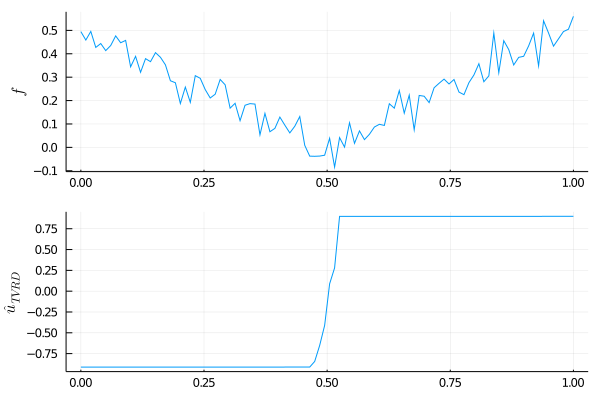

In [5]:
plot_FDM(data) # hide

#A strongly regularized result is obtained by calling `TVRegDiff` with `α=0.2`.
û = TVRegDiff(data, 500, 0.2; scale="small", dx=0.01, ε=1e-6)
plot_TVRegDiff(data, û) # hide

Because of keyword argument defaults, this is equal to calling

```julia
û = TVRegDiff(data, 500, 0.2)
```

A better result is obtained after 7000 iterations, though differences are minimal.

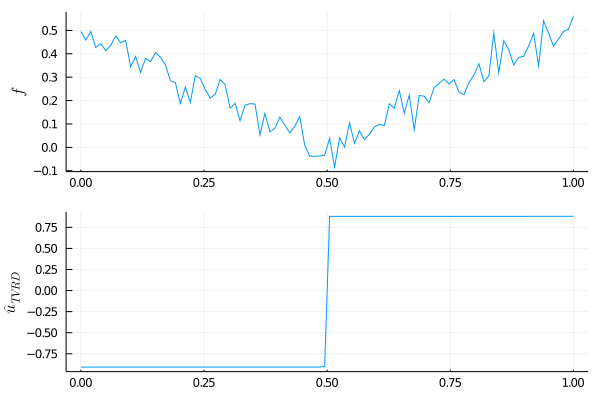

In [6]:
û = TVRegDiff(data, 7000, 0.2)
plot_TVRegDiff(data, û) # hide

In [7]:
savefig("paper_small7000.svg") #!nb # hide

## Large-scale example
The data in this example was obtained from a whole-room calorimeter.

In [8]:
file = CSV.File("../data/demo_large.csv")
df = DataFrame(file)
data = df.largescaledata

82799-element Vector{Float64}:
 0.04845155
 0.04840499
 0.04846865
 0.04847949
 0.04841906
 0.04851208
 0.04849811
 0.04851921
 0.04846517
 0.04842937
 ⋮
 0.2851974
 0.2846684
 0.2846099
 0.2846647
 0.2841715
 0.284931
 0.2854243
 0.2855478
 0.2855393

Computing derivates using naive finite differences gives a useless result:

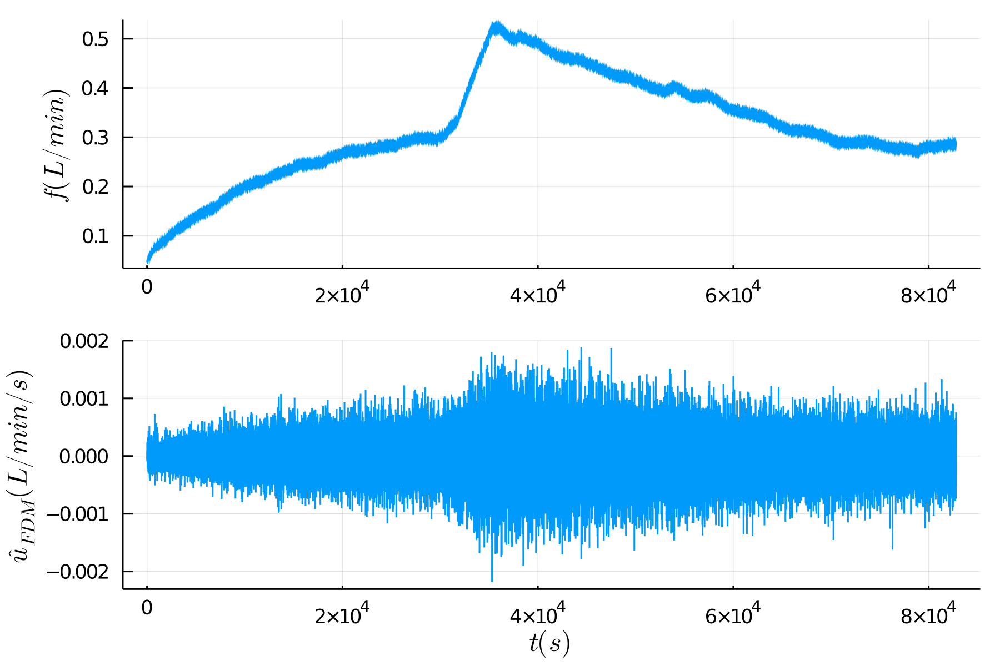

In [9]:
plot_demo_large_diff(data) # hide

Using `TVRegDiff` with `ε=1e-9`, we obtain a strongly regularized result. Larger values of ``\varepsilon`` improve conditioning and speed, while smaller values give more accurate results with sharper jumps.

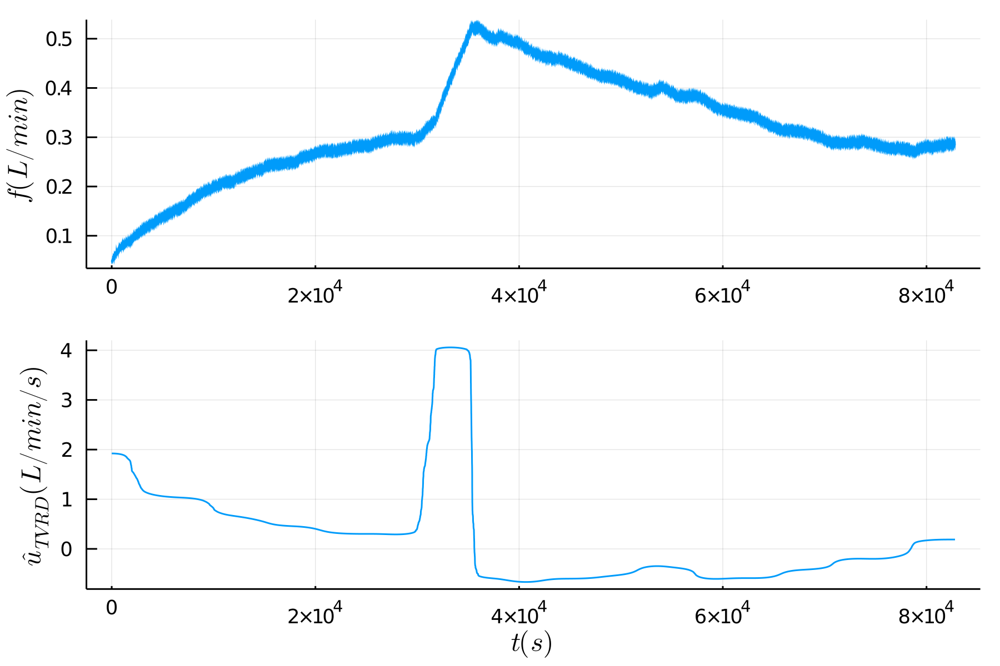

In [10]:
û = TVRegDiff(data, 40, 1e-1; scale="large", precond="amg_rs", ε=1e-9)
plot_TVRegDiff_all(data, û) # hide
savefig("paper_large_all.png") #!nb #hide
plot_demo_large_TVReg(data, û) # hide

Therefore raising ``\varepsilon`` to `1e-7` gives a smoother result. However, jumps in the derivative are also smoothed away.

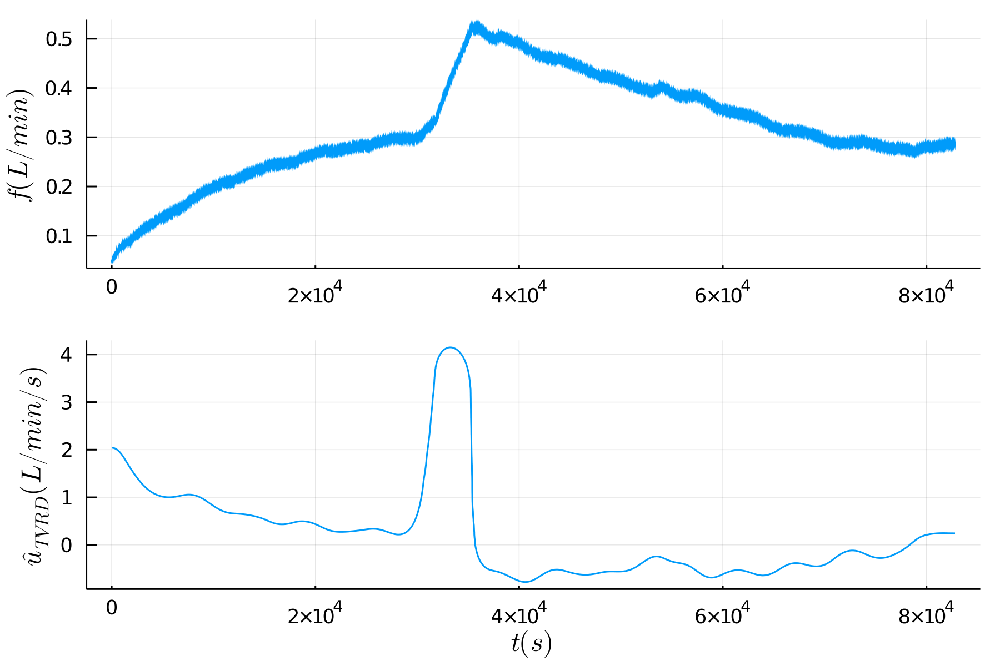

In [11]:
û = TVRegDiff(data, 40, 1e-1; scale="large", precond="amg_rs", ε=1e-7)
plot_demo_large_TVReg(data, û) # hide

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*